In [1]:
import torch
import os
import sys
import numpy as np

from PIL import Image
from einops import rearrange
from torchvision.utils import make_grid

parent = os.path.abspath(os.path.join('..'))
sys.path.append(parent)


from data.images import *
from data.misc import landmarks_to_2d_mask

In [2]:
def plot_from_tensor(x, nrow=8):
    x = torch.clamp((x + 1.0) / 2.0, min=0.0, max=1.0)
    
    grid = make_grid(x, nrow=nrow)
    grid = 255. * rearrange(grid, 'c h w -> h w c').cpu().numpy()
    
    im = Image.fromarray(grid.astype(np.uint8))
    im.show()

Landmarks

In [28]:
batch_size = 8
dataset = ImageLandmarks(df_path='/storage2/datasets/facial-hq/test/landmarks.pkl', image_size=256)
loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size)


batch = next(iter(loader))

In [29]:
masks = list()
for i in range(len(batch['image'])):
    masks.append(landmarks_to_2d_mask(batch['dense'][i].numpy(), 256))

batch['mask'] = torch.from_numpy(np.concatenate(masks, axis=0)).unsqueeze(dim=1) - 1.0

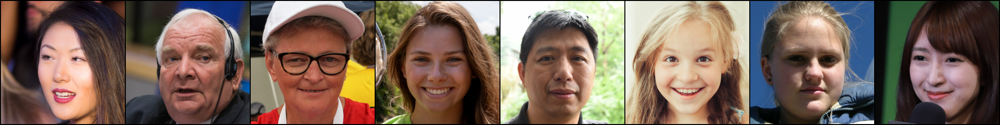

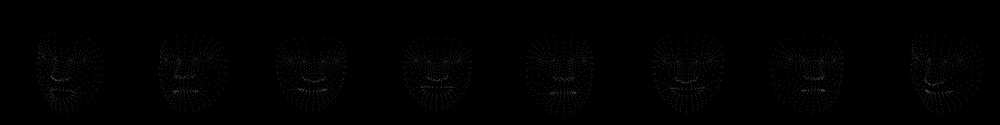

In [30]:
plot_from_tensor(batch['image'])
plot_from_tensor(batch['mask'])

In [31]:
from models import ConditionalDDPMPipeline, IdentEmbedder


device = 'cuda'
extract_keys = ['dense']
pipeline = ConditionalDDPMPipeline.from_pretrained('kligvasser/ffhq-vqvae-landmark').to(device)
embedder = IdentEmbedder(extract_keys=extract_keys).to(device)

Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

In [32]:
conditioned_values = dict()
for key in extract_keys:
    conditioned_values[key] = batch[key].float().to(device)

encoder_hidden_states = embedder(conditioned_values)

  0%|          | 0/200 [00:00<?, ?it/s]

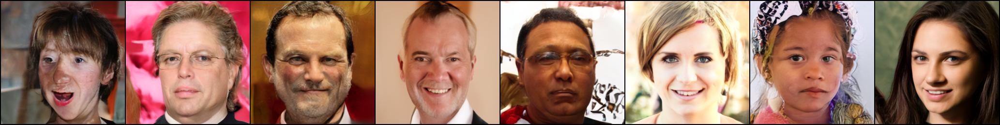

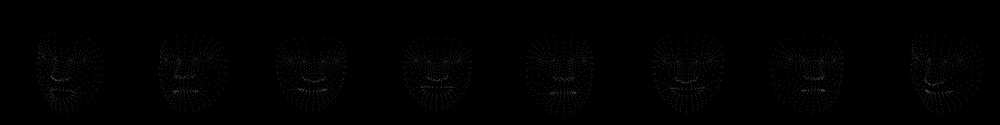

In [33]:
generator = torch.Generator(device=device)
generator.manual_seed(1234)

samples = pipeline(
    encoder_hidden_states=encoder_hidden_states,
    generator=generator,
    num_inference_steps=200,
    output_type='torch'
    )

plot_from_tensor(samples)
plot_from_tensor(batch['mask'])

In [9]:
latents = pipeline.prepare_latents(
    len(samples),
    pipeline.unet.dtype,
    pipeline._execution_device,
    generator
    )

latents = latents[0].unsqueeze(dim=0).repeat(len(samples), 1, 1, 1)

  0%|          | 0/200 [00:00<?, ?it/s]

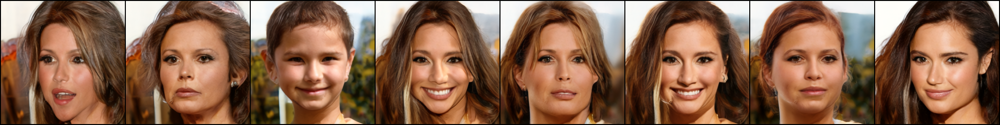

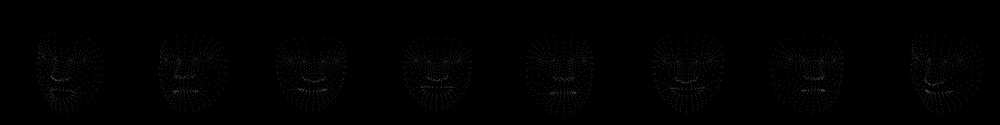

In [10]:
samples = pipeline(
    encoder_hidden_states=encoder_hidden_states,
    generator=generator,
    latents=latents,
    num_inference_steps=200,
    output_type='torch'
    )

plot_from_tensor(samples)
plot_from_tensor(batch['mask'])

Attributes

In [11]:
batch_size = 8
dataset = ImagesLibary(root='/storage2/datasets/facial-hq/test/images/', image_size=256)
loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size)


batch = next(iter(loader))

In [12]:
from models import ConditionalDDPMPipeline, AttributeEmbedder


device = 'cuda'
extract_keys = ['image']
pipeline = ConditionalDDPMPipeline.from_pretrained('kligvasser/ffhq-vqvae-attr').to(device)
embedder = AttributeEmbedder(extract_keys=extract_keys, path='../pretrained/attr-classifier-resnet50-gs/classifier_last.pt').to(device)

Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

/home/kligvasser/miniconda3/envs/diffusers/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/kligvasser/miniconda3/envs/diffusers/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [13]:
conditioned_values = dict()
for key in extract_keys:
    conditioned_values[key] = batch[key].float().to(device)

encoder_hidden_states = embedder(conditioned_values)

/home/kligvasser/miniconda3/envs/diffusers/lib/python3.8/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


  0%|          | 0/200 [00:00<?, ?it/s]

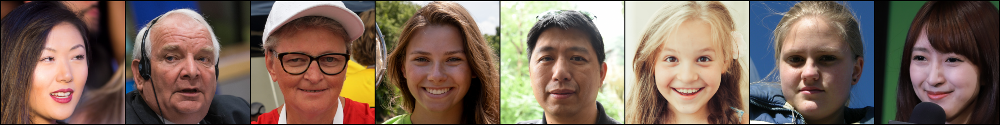

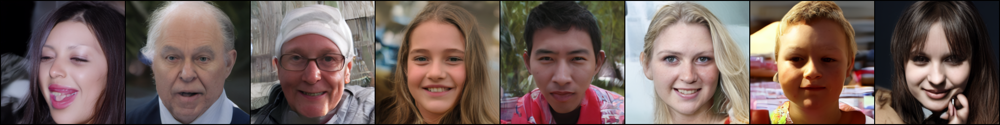

In [14]:
generator = torch.Generator(device=device)
generator.manual_seed(123)

samples = pipeline(
    encoder_hidden_states=encoder_hidden_states,
    generator=generator,
    num_inference_steps=200,
    output_type='torch'
    )

plot_from_tensor(batch['image'])
plot_from_tensor(samples)

  0%|          | 0/200 [00:00<?, ?it/s]

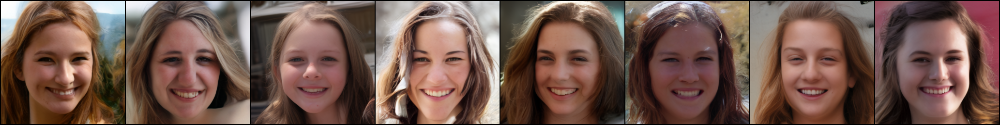

In [15]:
encoder_hidden_states_fixed = encoder_hidden_states[3].unsqueeze(dim=0).repeat(len(samples), 1, 1)

samples = pipeline(
    encoder_hidden_states=encoder_hidden_states_fixed,
    generator=generator,
    num_inference_steps=200,
    output_type='torch'
    )

plot_from_tensor(samples)

CLIP

In [16]:
batch_size = 8
dataset = ImagesLibary(root='/storage2/datasets/facial-hq/test/images/', image_size=256)
loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size)


batch = next(iter(loader))

In [17]:
from models import ConditionalDDPMPipeline, CLIPImageEmbedder


device = 'cuda'
extract_keys = ['image']
pipeline = ConditionalDDPMPipeline.from_pretrained('kligvasser/ffhq-vqvae-clip').to(device)
embedder = CLIPImageEmbedder().to(device)

Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

In [18]:
conditioned_values = dict()
for key in extract_keys:
    conditioned_values[key] = batch[key].float().to(device)

encoder_hidden_states = embedder(conditioned_values)

  0%|          | 0/200 [00:00<?, ?it/s]

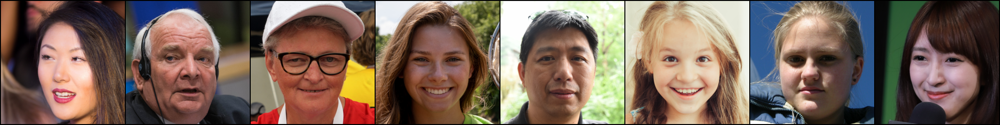

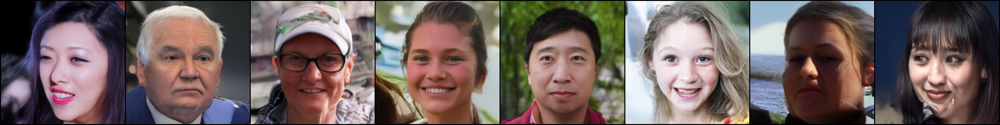

In [19]:
generator = torch.Generator(device=device)
generator.manual_seed(123)

samples = pipeline(
    encoder_hidden_states=encoder_hidden_states,
    generator=generator,
    num_inference_steps=200,
    output_type='torch'
    )

plot_from_tensor(batch['image'])
plot_from_tensor(samples)

In [20]:
import clip


text = clip.tokenize(['a zombie blond hair women']).to(device)
text_features = embedder.clip.encode_text(text)
encoder_hidden_states_customized = text_features.unsqueeze(dim=1).repeat(len(samples), 1, 1)

  0%|          | 0/200 [00:00<?, ?it/s]

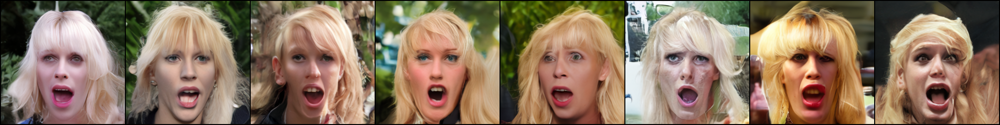

In [21]:
generator = torch.Generator(device=device)
generator.manual_seed(123)

samples = pipeline(
    encoder_hidden_states=encoder_hidden_states_customized,
    generator=generator,
    num_inference_steps=200,
    output_type='torch'
    )

plot_from_tensor(samples)

CLIP-Landmarks-Arcfaces

In [22]:
batch_size = 16
extract_keys = ['dense', 'arcface']
dataset = ImageLandmarks(df_path='/storage2/datasets/facial-hq/test/landmarks.pkl', keys=extract_keys, image_size=256)
loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size)


batch = next(iter(loader))

In [23]:
from models import ConditionalDDPMPipeline, ClipImageIdentEmbedder


device = 'cuda'
pipeline = ConditionalDDPMPipeline.from_pretrained('kligvasser/ffhq-vqvae-clip-landmark-arcface').to(device)
embedder = ClipImageIdentEmbedder(extract_keys=extract_keys).to(device)

Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

In [24]:
conditioned_values = dict()
for key in list(extract_keys + ['image']):
    conditioned_values[key] = batch[key].float().to(device)

encoder_hidden_states = embedder(conditioned_values)

/home/kligvasser/miniconda3/envs/diffusers/lib/python3.8/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


  0%|          | 0/200 [00:00<?, ?it/s]

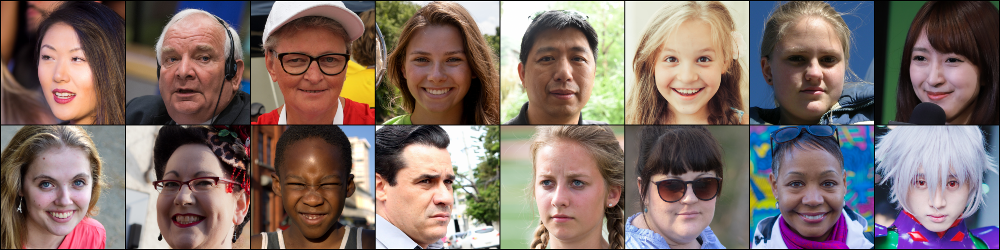

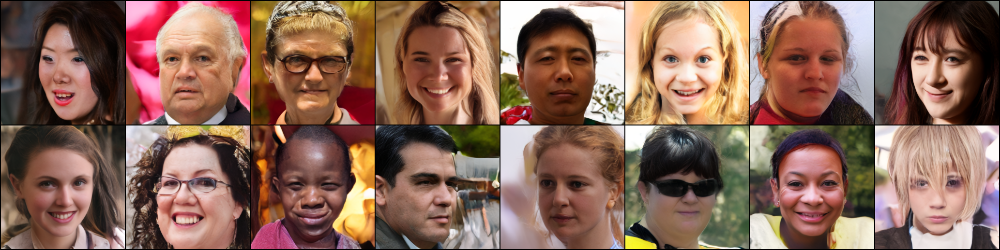

In [25]:
generator = torch.Generator(device=device)
generator.manual_seed(1234)

samples = pipeline(
    encoder_hidden_states=encoder_hidden_states,
    generator=generator,
    num_inference_steps=200,
    output_type='torch'
    )

plot_from_tensor(batch['image'])
plot_from_tensor(samples)